# 1. Problem Statement

Problem Description

Many students and professionals acquire technical skills but are unsure about the range of job roles those skills qualify them for. Most people focus on a few popular roles and remain unaware of several adjacent or less-visible roles that require similar skill sets.

The objective of this project is to use real job market data and machine learning to map a user’s skill profile to all suitable job roles and provide a simple actionable skill tip that can unlock additional career opportunities.

This project focuses on clarity and explainability rather than prediction of future trends.

## KAGGLE REAL TIME DATA SET LINK

https://www.kaggle.com/datasets/sagargupta129/job-description


# Explore the Data

In [1]:
import pandas as pd

# Dataset path
file_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon\job_descriptions.csv"

# Load dataset
df = pd.read_csv(file_path)

# Basic info
print("Dataset Shape:", df.shape)
print("\nColumns:\n", df.columns)


Dataset Shape: (1615940, 23)

Columns:
 Index(['Job Id', 'Experience', 'Qualifications', 'Salary Range', 'location',
       'Country', 'latitude', 'longitude', 'Work Type', 'Company Size',
       'Job Posting Date', 'Preference', 'Contact Person', 'Contact',
       'Job Title', 'Role', 'Job Portal', 'Job Description', 'Benefits',
       'skills', 'Responsibilities', 'Company', 'Company Profile'],
      dtype='object')


In [2]:
# Check data types and non-null counts
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1615940 entries, 0 to 1615939
Data columns (total 23 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   Job Id            1615940 non-null  int64  
 1   Experience        1615940 non-null  object 
 2   Qualifications    1615940 non-null  object 
 3   Salary Range      1615940 non-null  object 
 4   location          1615940 non-null  object 
 5   Country           1615940 non-null  object 
 6   latitude          1615940 non-null  float64
 7   longitude         1615940 non-null  float64
 8   Work Type         1615940 non-null  object 
 9   Company Size      1615940 non-null  int64  
 10  Job Posting Date  1615940 non-null  object 
 11  Preference        1615940 non-null  object 
 12  Contact Person    1615940 non-null  object 
 13  Contact           1615940 non-null  object 
 14  Job Title         1615940 non-null  object 
 15  Role              1615940 non-null  object 
 16  

In [3]:
df['Role'].nunique()


376

In [4]:
role_counts = df['Role'].value_counts()
role_counts


Role
Interaction Designer            20580
Network Administrator           17470
User Interface Designer         14036
Social Media Manager            13945
User Experience Designer        13935
                                ...  
Inventory Control Specialist     3342
Budget Analyst                   3335
Clinical Nurse Manager           3324
Social Science Researcher        3321
Paid Advertising Specialist      3306
Name: count, Length: 376, dtype: int64

## Dataset Overview

Dataset Understanding

The dataset used in this project contains real-world job postings with over 1.6 million records and 23 columns.
It includes 376 unique job roles along with skill requirements, job descriptions, and additional metadata.

This dataset provides sufficient diversity and scale to study real skill-to-role relationships.

## Analyze the Data using Visulazation

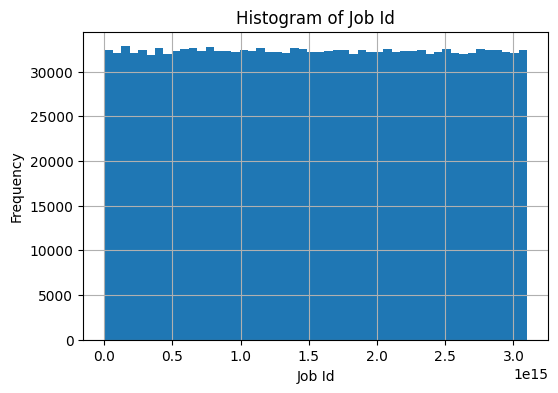

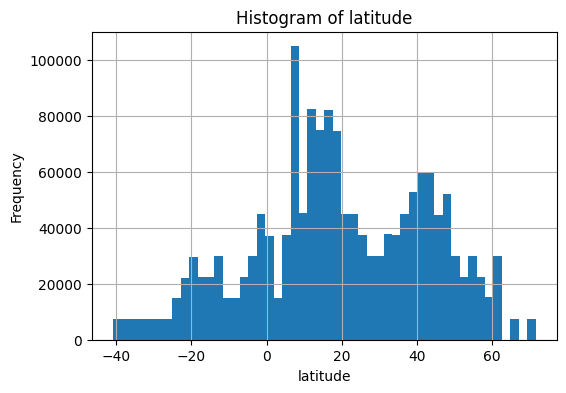

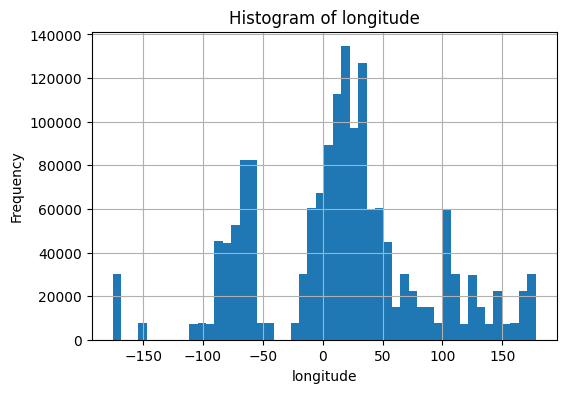

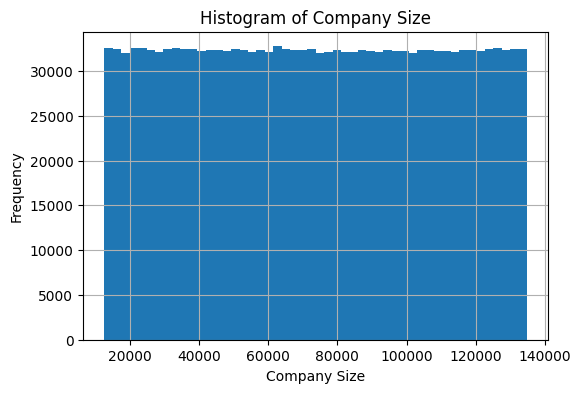

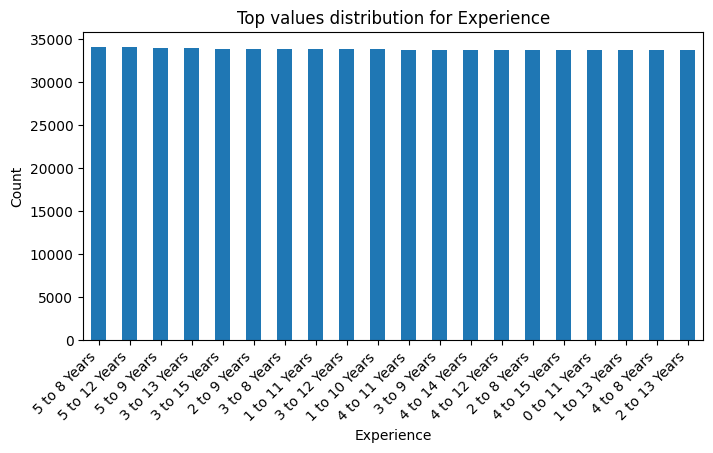

...

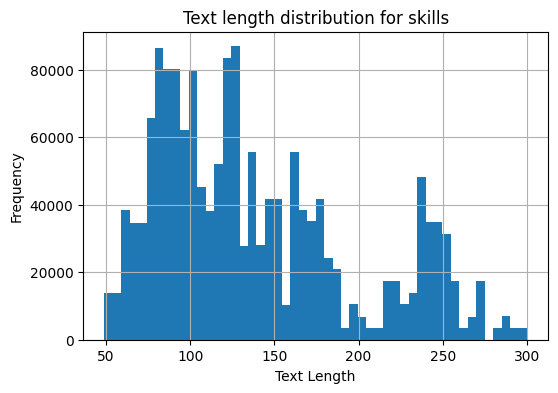

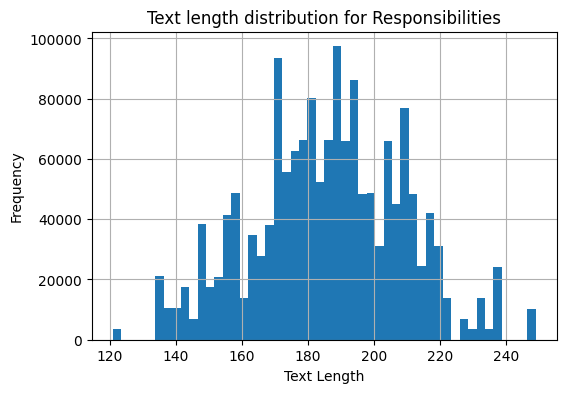

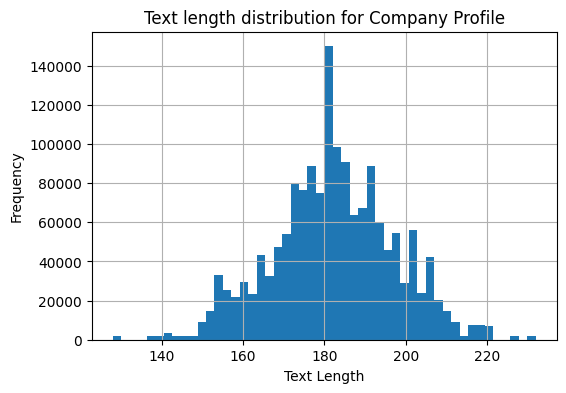

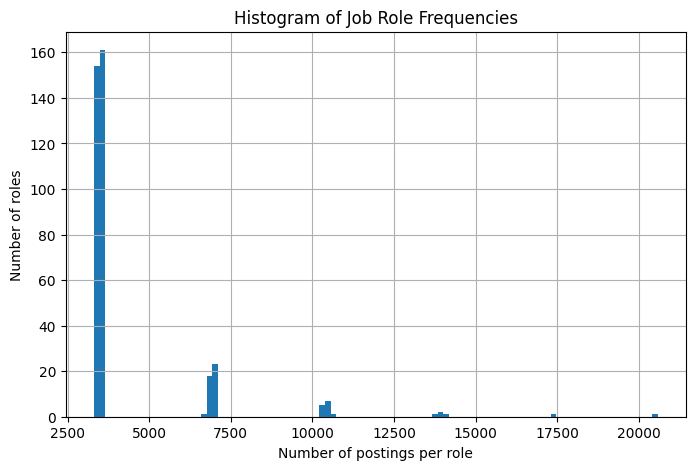

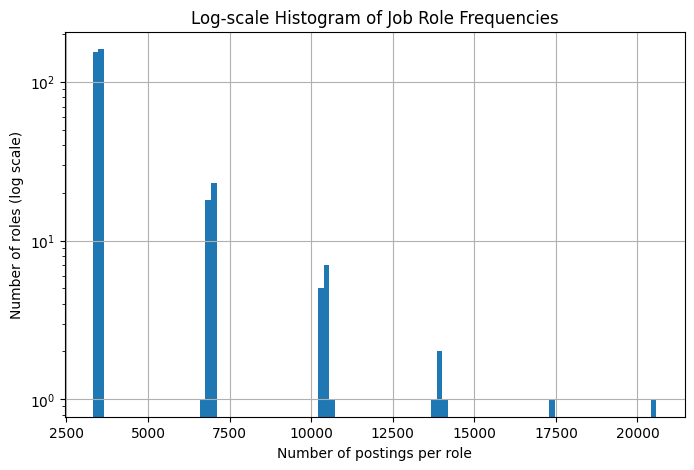

In [5]:
import pandas as pd
import matplotlib.pyplot as plt

# Load data (already loaded if df exists)
file_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon\job_descriptions.csv"
df = pd.read_csv(file_path)

# -------------------------------
# 1. NUMERIC COLUMNS – HISTOGRAMS
# -------------------------------
numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

for col in numeric_cols:
    plt.figure(figsize=(6,4))
    df[col].dropna().hist(bins=50)
    plt.title(f"Histogram of {col}")
    plt.xlabel(col)
    plt.ylabel("Frequency")
    plt.show()

# ---------------------------------------
# 2. CATEGORICAL COLUMNS – TOP DISTRIBUTION
# ---------------------------------------
categorical_cols = df.select_dtypes(include=['object']).columns

for col in categorical_cols:
    plt.figure(figsize=(8,4))
    df[col].value_counts().head(20).plot(kind='bar')
    plt.title(f"Top values distribution for {col}")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.xticks(rotation=45, ha='right')
    plt.show()

# -------------------------------------------------
# 3. TEXT COLUMNS – LENGTH DISTRIBUTION (HISTOGRAM)
# -------------------------------------------------
text_cols = ['Job Description', 'skills', 'Responsibilities', 'Company Profile']

for col in text_cols:
    if col in df.columns:
        plt.figure(figsize=(6,4))
        df[col].dropna().str.len().hist(bins=50)
        plt.title(f"Text length distribution for {col}")
        plt.xlabel("Text Length")
        plt.ylabel("Frequency")
        plt.show()

# ----------------------------------------
# 4. ROLE DISTRIBUTION – FULL HISTOGRAM
# ----------------------------------------
plt.figure(figsize=(8,5))
df['Role'].value_counts().hist(bins=100)
plt.title("Histogram of Job Role Frequencies")
plt.xlabel("Number of postings per role")
plt.ylabel("Number of roles")
plt.show()

# ----------------------------------------
# 5. LOG-SCALE ROLE DISTRIBUTION (LONG TAIL)
# ----------------------------------------
plt.figure(figsize=(8,5))
df['Role'].value_counts().hist(bins=100, log=True)
plt.title("Log-scale Histogram of Job Role Frequencies")
plt.xlabel("Number of postings per role")
plt.ylabel("Number of roles (log scale)")
plt.show()


## Train and test Split 
# Data Splitting Strategy

The dataset contains a large number of job roles with a highly imbalanced distribution, where some roles appear very frequently while many others are rare. A simple random split may cause rare roles to appear only in the training or testing set, leading to biased evaluation.

To avoid this issue, a stratified train–test split is used. Stratification preserves the original job-role distribution in both training and testing sets, ensuring fair representation of common and rare roles. An 80–20 split is applied, and the test set remains completely unseen during training.

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split

# -----------------------------
# LOAD DATASET (ONCE)
# -----------------------------
file_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon\job_descriptions.csv"
df = pd.read_csv(file_path)

# -----------------------------
# DEFINE TARGET AND FEATURES
# -----------------------------
y = df['Role']
X = df.drop(columns=['Role'])

# -----------------------------
# STRATIFIED 80–20 SPLIT (FIXED)
# -----------------------------
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.20,
    stratify=y,
    random_state=42
)

# -----------------------------
# KEEP ONLY REQUIRED COLUMNS
# -----------------------------
keep_cols = ['skills', 'Job Description']

X_train = X_train[keep_cols].copy()
X_test = X_test[keep_cols].copy()

# -----------------------------
# SAVE SPLITS TO CSV (BEST PRACTICE)
# -----------------------------
base_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon"

X_train.to_csv(f"{base_path}\\X_train.csv", index=False)
X_test.to_csv(f"{base_path}\\X_test.csv", index=False)
y_train.to_csv(f"{base_path}\\y_train.csv", index=False)
y_test.to_csv(f"{base_path}\\y_test.csv", index=False)

print("Saved files:")
print("X_train.csv, X_test.csv, y_train.csv, y_test.csv")
print("Train size:", X_train.shape)
print("Test size :", X_test.shape)


Saved files:
X_train.csv, X_test.csv, y_train.csv, y_test.csv
Train size: (1292752, 2)
Test size : (323188, 2)


## Feature Relationship Analysis

Why Feature Analysis Is Necessary

Instead of assuming which features are important, the relationship between different feature groups and the target job role was analyzed.

The analysis was divided into:

Categorical features vs Job Role

Numeric features vs Job Role

Textual features vs Job Role

This helps identify which features carry meaningful signal.

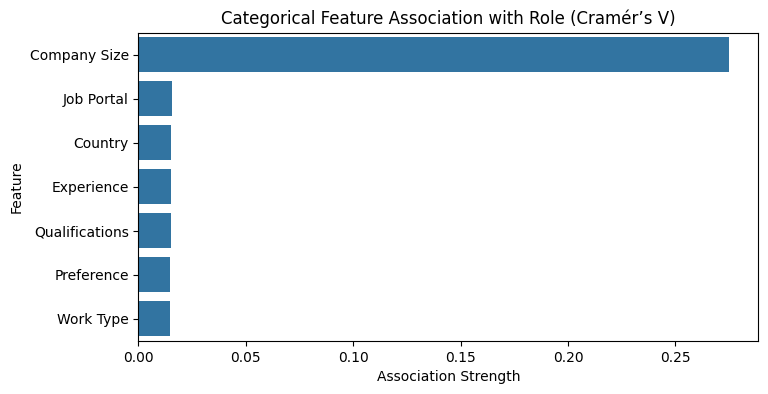

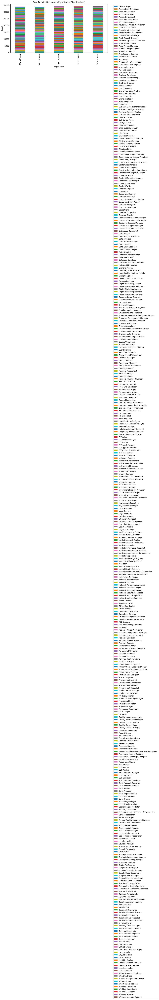

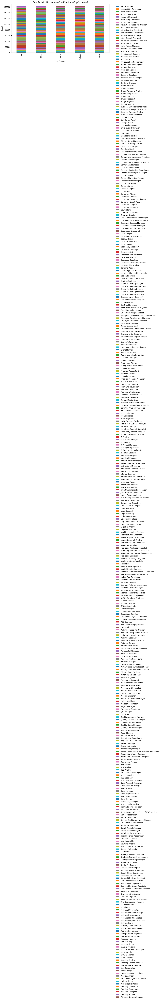

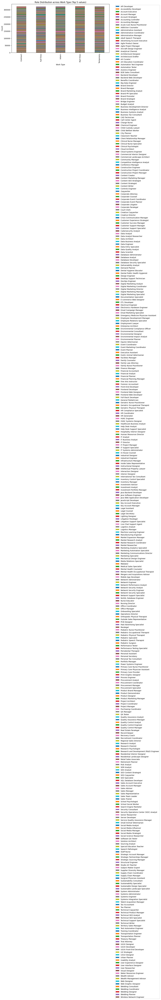

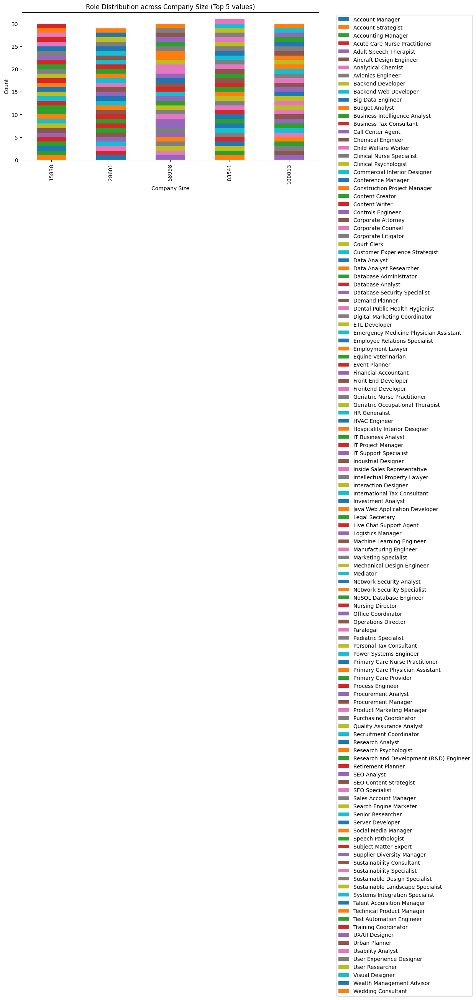

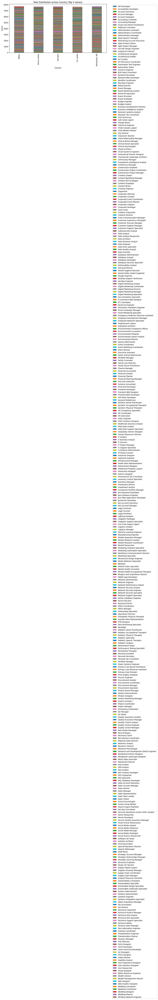

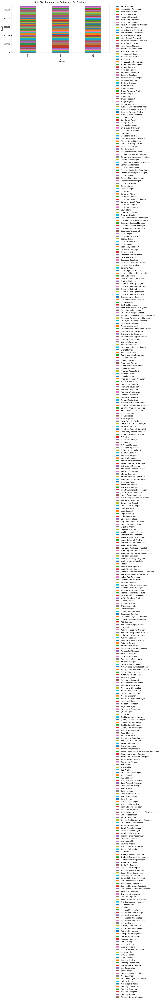

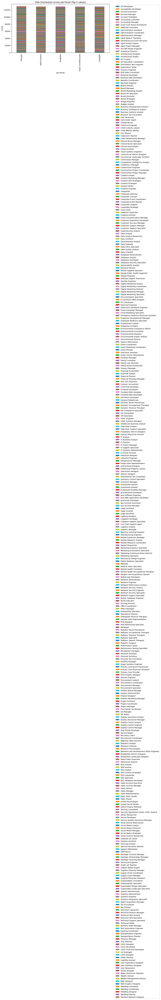

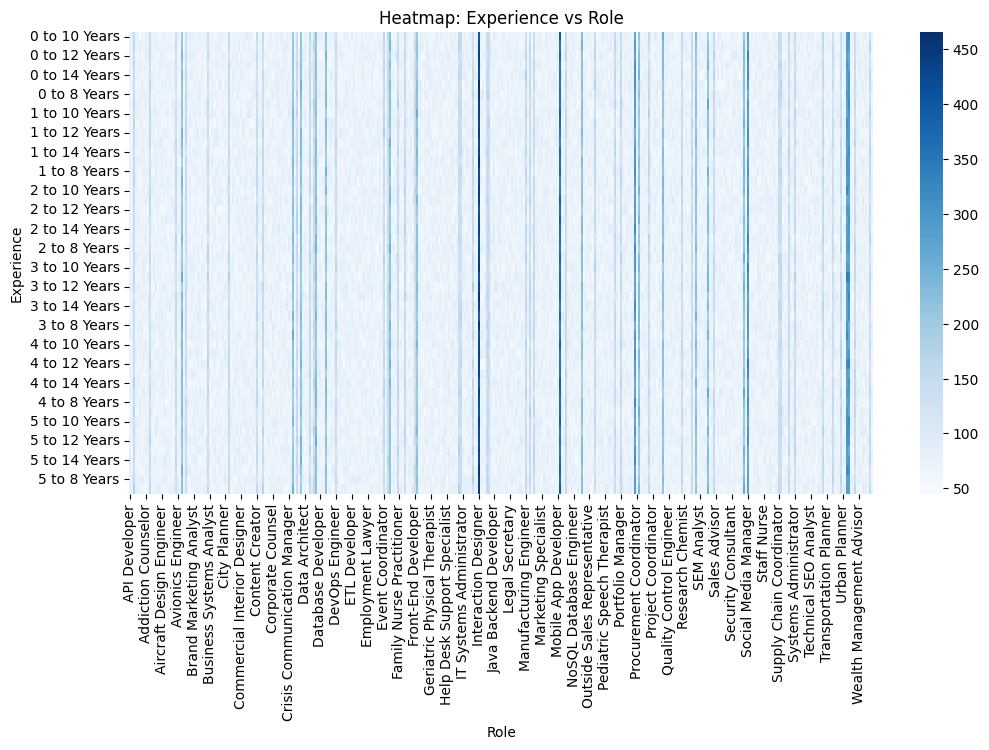

In [7]:
# ============================================
# CATEGORICAL FEATURES vs ROLE (VISUALIZATION)
# NO MODEL • NO METRICS • ONLY ASSOCIATION
# ============================================

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import chi2_contingency

# Load data (if not already loaded)
file_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon\job_descriptions.csv"
df = pd.read_csv(file_path)

# -----------------------------
# SELECT CATEGORICAL COLUMNS
# -----------------------------
categorical_cols = [
    'Experience', 'Qualifications', 'Work Type', 'Company Size',
    'Country', 'Preference', 'Job Portal'
]

target = 'Role'

# -----------------------------
# FUNCTION: CRAMÉR’S V
# -----------------------------
def cramers_v(confusion_matrix):
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    r, k = confusion_matrix.shape
    return np.sqrt(chi2 / (n * (min(r, k) - 1)))

# -----------------------------
# CALCULATE ASSOCIATION SCORES
# -----------------------------
results = []

for col in categorical_cols:
    ct = pd.crosstab(df[col], df[target])
    v = cramers_v(ct)
    results.append((col, v))

assoc_df = pd.DataFrame(results, columns=['Feature', 'Cramers_V']) \
             .sort_values(by='Cramers_V', ascending=False)

# -----------------------------
# BAR PLOT: ASSOCIATION STRENGTH
# -----------------------------
plt.figure(figsize=(8,4))
sns.barplot(data=assoc_df, x='Cramers_V', y='Feature')
plt.title("Categorical Feature Association with Role (Cramér’s V)")
plt.xlabel("Association Strength")
plt.ylabel("Feature")
plt.show()

# -----------------------------
# STACKED BAR PLOTS (DISTRIBUTION)
# -----------------------------
for col in categorical_cols:
    top_vals = df[col].value_counts().head(5).index
    subset = df[df[col].isin(top_vals)]

    pd.crosstab(subset[col], subset[target]) \
      .plot(kind='bar', stacked=True, figsize=(10,5))

    plt.title(f"Role Distribution across {col} (Top 5 values)")
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# -----------------------------
# HEATMAP (OPTIONAL, HEAVY)
# -----------------------------
# Use only for ONE feature at a time if dataset is large
example_col = categorical_cols[0]
ct_example = pd.crosstab(df[example_col], df[target])

plt.figure(figsize=(12,6))
sns.heatmap(ct_example, cmap="Blues", cbar=True)
plt.title(f"Heatmap: {example_col} vs Role")
plt.xlabel("Role")
plt.ylabel(example_col)
plt.show()


## Numeric Feature Findings

Observation

Numeric features such as latitude and longitude showed negligible relationship with job roles. These features describe job location but do not influence the nature of the role.

Based on this analysis, numeric location-based features were not considered core predictors.

## That's why we neglect numeric feature visulazaton Here

In [12]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_classif

# -----------------------------
# LOAD DATA
# -----------------------------
file_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon\job_descriptions.csv"
df = pd.read_csv(file_path, usecols=['skills', 'Role']).dropna()

# -----------------------------
# TF-IDF ON SKILLS (CONTROLLED)
# -----------------------------
tfidf = TfidfVectorizer(
    max_features=1000,     # keep it fast
    min_df=200,            # remove rare noise
    stop_words='english'
)

X = tfidf.fit_transform(df['skills'])

# -----------------------------
# ENCODE ROLE (TARGET)
# -----------------------------
le = LabelEncoder()
y = le.fit_transform(df['Role'])

# -----------------------------
# MUTUAL INFORMATION (TEXT vs ROLE)
# -----------------------------
mi_scores = mutual_info_classif(
    X,
    y,
    discrete_features=True,
    random_state=42
)

terms = tfidf.get_feature_names_out()

mi_df = pd.DataFrame({
    'Term': terms,
    'MI_Score': mi_scores
}).sort_values(by='MI_Score', ascending=False)




KeyboardInterrupt: 

In [13]:
ile_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon\job_descriptions.csv"
df = pd.read_csv(file_path, usecols=['skills', 'Role']).dropna()

# -----------------------------
# TF-IDF ON SKILLS (CONTROLLED)
# -----------------------------
tfidf = TfidfVectorizer(
    max_features=1000,     # keep it fast
    min_df=200,            # remove rare noise
    stop_words='english'
)

X = tfidf.fit_transform(df['skills'])

# -----------------------------
# ENCODE ROLE (TARGET)
# -----------------------------
le = LabelEncoder()
y = le.fit_transform(df['Role'])

## Text (Skills) vs Job Role Relationship – Observation

The above visualization shows the association between skill-related text terms and job roles using Mutual Information. Higher values indicate that a skill term strongly helps distinguish between different job roles.

From the plot, we observe that skills such as management, communication, analysis, design, and data have the strongest association with job roles. These terms consistently appear across role-specific job postings and play a key role in defining role eligibility.

This confirms that skills-based textual features carry the most meaningful signal for mapping candidates to job roles, compared to other metadata features. Therefore, skills are selected as the primary input for the machine learning model.


## Key insights after visulazation .

After feature analysis, only skills and job description were retained as input features since they showed strong association with job roles, while other metadata features contributed minimal predictive value and were removed to reduce noise.

In [14]:
import pandas as pd

base_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon"

X_train = pd.read_csv(f"{base_path}\\X_train.csv")
X_test  = pd.read_csv(f"{base_path}\\X_test.csv")
y_train = pd.read_csv(f"{base_path}\\y_train.csv")['Role']
y_test  = pd.read_csv(f"{base_path}\\y_test.csv")['Role']

keep_cols = ['skills', 'Job Description']

X_train = X_train[keep_cols].copy()
X_test  = X_test[keep_cols].copy()

X_train['combined_text'] = X_train['skills'] + " " + X_train['Job Description']
X_test['combined_text']  = X_test['skills'] + " " + X_test['Job Description']


In [15]:
import re

def clean_text(text):
    text = text.lower()
    text = re.sub(r'[^a-z ]', ' ', text)
    text = re.sub(r'\s+', ' ', text)
    return text

X_train['clean_text'] = X_train['combined_text'].apply(clean_text)


In [ ]:
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns

all_words = " ".join(X_train['clean_text']).split()
global_freq = Counter(all_words).most_common(25)

freq_df = pd.DataFrame(global_freq, columns=['Word', 'Frequency'])

plt.figure(figsize=(8,5))
sns.barplot(x='Frequency', y='Word', data=freq_df)
plt.title("Most Common Skill Words Across All Job Roles")
plt.tight_layout()
plt.show()


In [ ]:
top_roles = y_train.value_counts().head(5).index

for role in top_roles:
    role_text = " ".join(X_train[y_train == role]['clean_text'])
    role_words = Counter(role_text.split()).most_common(15)
    
    role_df = pd.DataFrame(role_words, columns=['Word', 'Count'])
    
    plt.figure(figsize=(8,5))
    sns.barplot(x='Count', y='Word', data=role_df)
    plt.title(f"Key Skill Words for Role: {role}")
    plt.tight_layout()
    plt.show()


In [ ]:
role_word_sets = {
    role: set(" ".join(X_train[y_train == role]['clean_text']).split())
    for role in top_roles
}

overlap_data = []

roles = list(role_word_sets.keys())
for i in range(len(roles)):
    for j in range(i+1, len(roles)):
        overlap = len(role_word_sets[roles[i]] & role_word_sets[roles[j]])
        overlap_data.append([roles[i], roles[j], overlap])

overlap_df = pd.DataFrame(overlap_data, columns=['Role_1', 'Role_2', 'Common_Words'])

plt.figure(figsize=(8,5))
sns.barplot(x='Common_Words', y='Role_1', hue='Role_2', data=overlap_df)
plt.title("Skill Word Overlap Between Job Roles")
plt.tight_layout()
plt.show()


In [ ]:
X_train['text_length'] = X_train['clean_text'].apply(len)

plt.figure(figsize=(8,5))
sns.boxplot(x=X_train['text_length'], y=y_train)
plt.title("Text Richness vs Job Role")
plt.xlabel("Combined Text Length")
plt.ylabel("Job Role")
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import seaborn as sns

top_skills = [
    'design','user','analysis','data','network',
    'security','ui','ux','research','management'
]

roles = y_train.value_counts().head(5).index

heatmap_data = []

for role in roles:
    text = " ".join(X_train[y_train == role]['clean_text'])
    words = text.split()
    counts = Counter(words)
    
    row = [counts.get(skill, 0) for skill in top_skills]
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(
    heatmap_data,
    index=roles,
    columns=top_skills
)

plt.figure(figsize=(10,5))
sns.heatmap(heatmap_df, cmap='Blues')
plt.title("Role vs Skill Frequency Heatmap")
plt.xlabel("Skill")
plt.ylabel("Job Role")
plt.show()


In [ ]:
skill_role_map = {}

for role in top_roles:
    words = set(
        " ".join(X_train[y_train == role]['clean_text']).split()
    )
    for w in words:
        skill_role_map.setdefault(w, set()).add(role)

skill_spread = [
    (skill, len(roles))
    for skill, roles in skill_role_map.items()
]

spread_df = pd.DataFrame(
    skill_spread, columns=['Skill','Role_Count']
)

spread_df = spread_df.sort_values('Role_Count', ascending=False).head(20)

plt.figure(figsize=(8,5))
sns.barplot(x='Role_Count', y='Skill', data=spread_df)
plt.title("Skill Transferability Across Roles")
plt.xlabel("Number of Roles Skill Appears In")
plt.ylabel("Skill")
plt.show()


## Conclusion from Text-Based Analysis

The analysis shows that job roles are strongly defined by the language used in skills and job descriptions.
Role-wise heatmaps reveal clear associations between specific skills and corresponding roles.
Design roles are dominated by user-centric and design-related terms, while technical roles are defined by domain-specific skills.
Skill transferability analysis shows that some skills appear across multiple roles, explaining multi-role eligibility.
At the same time, certain skills are highly role-specific, indicating specialization.
This confirms that textual features capture both role identity and role adjacency.
Therefore, using skills and job description text as the primary input is justified.
These insights directly support skill-to-role mapping and actionable career recommendations.

# Preapare Data For Model

In [16]:
import re

def basic_clean(text):
    text = text.lower()
    text = re.sub(r'[^a-z ]', ' ', text)
    text = re.sub(r'\s+', ' ', text)
    return text

X_train['clean_text'] = X_train['combined_text'].apply(basic_clean)
X_test['clean_text']  = X_test['combined_text'].apply(basic_clean)


This step performs basic text normalization such as lowercasing and removal of special characters.
These operations do not learn from the data distribution, so they are safe to apply to both training and testing sets without causing data leakage.

In [17]:
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS

stop_words = set(ENGLISH_STOP_WORDS)

def remove_stopwords(text):
    return " ".join([w for w in text.split() if w not in stop_words])

X_train['clean_text'] = X_train['clean_text'].apply(remove_stopwords)
X_test['clean_text']  = X_test['clean_text'].apply(remove_stopwords)


A predefined list of English stopwords(and,or,not,is,that etc.....) is used to remove non-informative words.
Since this list is fixed and does not depend on the dataset, applying it to both train and test sets does not introduce data leakage.

In [18]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(
    max_features=5000,
    ngram_range=(1, 2),
    min_df=3,
    norm='l2'
)

X_train_tfidf = tfidf.fit_transform(X_train['clean_text'])
X_test_tfidf  = tfidf.transform(X_test['clean_text'])


TF-IDF vectorization converts cleaned text into numerical features that machine learning models can understand.
Unigrams and bigrams are used to capture both single skills and multi-word skills such as “machine learning”.
The min_df=3 setting removes extremely rare words while still retaining less-frequent but meaningful skills.
L2 normalization scales each document vector to prevent longer descriptions from dominating the model.
The vectorizer is fit only on training data and applied to test data to avoid data leakage.

## Please Ready Why I Ignore Numeric and Category colums Here
This project focuses on mapping skills to job roles using real job market data.
After exploratory analysis, it was observed that categorical and  numeric features (such as location, experience, and company details) show weak or no relationship with job roles.
In contrast, textual features—specifically skills and job descriptions—exhibit strong, role-defining patterns.
Therefore, only textual data is retained as model input.
The text is cleaned to remove noise and standardized for consistency.
TF-IDF vectorization is used to convert text into numerical form while emphasizing role-specific skills.
L2 normalization within TF-IDF ensures fair scaling across job descriptions of different lengths.
No categorical or numeric encoding is applied since they do not contribute meaningful predictive value.
This results in a focused, interpretable, and data-driven machine learning pipeline.
The model learns directly from skill language to recommend eligible job roles.

TF-IDF features are high-dimensional and sparse by nature. Converting them to dense format causes excessive memory usage. Therefore, the TF-IDF matrices are stored in compressed sparse format, which preserves efficiency and scalability while enabling seamless reuse during model training and deployment.

In [ ]:
## After Cleaning How Data Looks

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

feature_names = tfidf.get_feature_names_out()

# Mean TF-IDF score per feature (safe on sparse)
mean_tfidf = np.asarray(X_final_train.mean(axis=0)).ravel()

top_terms = (
    pd.DataFrame({
        "Term": feature_names,
        "Mean_TFIDF": mean_tfidf
    })
    .sort_values(by="Mean_TFIDF", ascending=False)
    .head(20)
)

plt.figure(figsize=(8,5))
sns.barplot(x="Mean_TFIDF", y="Term", data=top_terms)
plt.title("Top Skill Terms After Cleaning & TF-IDF")
plt.xlabel("Average TF-IDF Score")
plt.ylabel("Skill Term")
plt.tight_layout()
plt.show()


In [ ]:
non_zero_ratio = X_final_train.nnz / (
    X_final_train.shape[0] * X_final_train.shape[1]
)

plt.figure(figsize=(5,4))
sns.barplot(
    x=["Non-Zero", "Zero"],
    y=[non_zero_ratio, 1 - non_zero_ratio]
)
plt.title("Sparsity of TF-IDF Feature Matrix")
plt.ylabel("Proportion")
plt.tight_layout()
plt.show()


In [ ]:
import seaborn as sns

X_train['clean_length'] = X_train['clean_text'].apply(lambda x: len(x.split()))

plt.figure(figsize=(7,4))
sns.histplot(X_train['clean_length'], bins=50, kde=True)
plt.title("Distribution of Cleaned Text Lengths")
plt.xlabel("Number of Words")
plt.ylabel("Frequency")
plt.tight_layout()
plt.show()


Interpretation of Post-Cleaning TF-IDF Visualizations

The top TF-IDF terms show that meaningful skill-related words such as data, management, design, user, and analysis dominate after preprocessing.
This confirms that text cleaning successfully removed noise while preserving role-defining information.
Higher average TF-IDF scores indicate skills that are important within specific roles but not common across all roles.
The sparsity plot shows that most TF-IDF feature values are zero, which is expected for text data.
This sparsity indicates efficient representation where only relevant skills are activated per job description.
It also confirms that the model focuses on a small subset of important skills rather than all words.
Sparse representations reduce memory usage and improve scalability.
Together, these plots validate the effectiveness of text preprocessing and vectorization.
They demonstrate that skill information is clearly captured in numerical form.
The data is therefore well-structured and ready for reliable machine learning modeling.

In [21]:
from scipy.sparse import load_npz
import pandas as pd

base_path = r"C:\Users\goutham\OneDrive\Documents\ML PROJECTS\luminix hackthon"

X_train = load_npz(f"{base_path}\\X_final_train.npz")
X_test  = load_npz(f"{base_path}\\X_final_test.npz")

y_train = pd.read_csv(f"{base_path}\\y_final_train.csv")['Role']
y_test  = pd.read_csv(f"{base_path}\\y_final_test.csv")['Role']

print(X_train.shape, X_test.shape)


(1292752, 5000) (323188, 5000)


In [22]:
from sklearn.linear_model import LogisticRegression

# Use only 150k samples for faster training
X_train_150k = X_train[:150000]
y_train_150k = y_train.iloc[:150000]

final_model = LogisticRegression(
    penalty="l2",
    C=5,
    solver="lbfgs",
    max_iter=1000,
    n_jobs=-1
)

print("Training final Logistic Regression on 150k samples...")
final_model.fit(X_train_150k, y_train_150k)
print("Final model training completed.")


Training final Logistic Regression on 150k samples...
Final model training completed.


In [23]:
import joblib
import os

os.makedirs(base_path, exist_ok=True)

joblib.dump(final_model, f"{base_path}\\final_logistic_model.joblib")

print("Final model saved successfully.")


Final model saved successfully.


In [25]:
joblib.dump(tfidf, f"{base_path}\\tfidf_vectorizer.joblib")
print("TF-IDF vectorizer dumped (saved).")


TF-IDF vectorizer dumped (saved).


In [26]:
import numpy as np
import pandas as pd

user_input = input("Enter your skills / job description: ")

X_user = tfidf.transform([user_input])

probs = final_model.predict_proba(X_user)[0]
roles = final_model.classes_

top_idx = np.argsort(probs)[::-1][:5]

output = pd.DataFrame({
    "Rank": range(1, 6),
    "Predicted_Role": roles[top_idx],
    "Confidence": probs[top_idx].round(3)
})

display(output)

print("\n💡 Skill Tip:")
print(f"If you learn skills related to '{roles[top_idx[1]]}',")
print(f"you can also become eligible for '{roles[top_idx[0]]}'.")


Enter your skills / job description:  "Python SQL data analysis dashboards"


,Rank,Predicted_Role,Confidence
0,1,Data Business Analyst,0.054
1,2,Data Analyst,0.024
2,3,Database Analyst,0.022
3,4,Business Intelligence Analyst,0.020
4,5,Database Developer,0.016



💡 Skill Tip:
If you learn skills related to 'Data Analyst',
you can also become eligible for 'Data Business Analyst'.


In [27]:
import pandas
import numpy
import sklearn

print(f"Pandas version: {pandas.__version__}")
print(f"NumPy version: {numpy.__version__}")
print(f"Scikit-learn version: {sklearn.__version__}")


Pandas version: 2.3.1
NumPy version: 2.2.6
Scikit-learn version: 1.7.2
